# Exoplanets - Coursework Submission: Exercise 2
### Steven Dillmann

**MPhil Data Intensive Science | University of Cambridge**

21st June 2024

[sd2022@cam.ac.uk](sd2022@cam.ac.uk)

This notebook was written by Steven Dillmann as part of the coursework submission for the *Exoplanets* module in the MPhil in Data Intensive Science at the University of Cambridge. The coursework assignment can be found here: [Exoplanets - Coursework Assignment](Exoplanets.pdf). The associated report can be found here: [Exoplanets - Coursework Report](report/exo_sd2022_report.pdf).


## Set-Up

### Installations

In [1]:
# Make sure necessary packages are installed

!pip install statsmodels
!pip install numpy
!pip install pandas
!pip install matplotlib
!python -m pip install lightkurve --upgrade
!pip install astropy
!pip install george
!pip install dynesty



### Imports and Settings

In [2]:
# Import required libraries
import numpy as np
import pandas as pd
import seaborn as sns
import statsmodels.api as sm
import matplotlib.pyplot as plt
import scipy as sp
import george 
import emcee
from george import kernels, GP
from scipy import optimize
from astropy.timeseries import LombScargle
from utils.plot_tool import plot_time_series_all, plot_periodograms_all, plot_correlations, plot_long_term_trend, plot_stellar_gp_results2, plot_gp_predict
from utils.gp_tool3 import multi_stellar_gp, K_qp, K_qp_multi, gp_predict

# Set up plotting style
plt.style.use('sd2022.mplstyle')
# plt.rcParams['font.family'] = 'sans-serif'
# plt.rcParams['font.family'] = 'DejaVu Sans'
# plt.rcParams['font.family'] = 'Gill Sans'
sd2022_blue = '#3772ff'
sd2022_red = '#FF033E'
sd2022_green = '#05a45c'
sd2022_purple = '#994d9e' 
sd2022_orange = '#ff8243'
sd2022_pink = '#df37d6'
sd2022_turq = '#30d5c8'
sd2022_gold = '#cfbd62' 
sd2022_silver = '#C0C0C0'
sd2022_bronze =  '#b08d57'

color_secondary = sd2022_red
color_model = sd2022_green
color_model2 = sd2022_pink


### Load Data

In [3]:
# Load the Doppler radial velocity data
data_path = '../data/ex2_RVs.txt'
df_full = pd.read_csv(data_path, delimiter=',', header=None, names=['time', 'rv', 'rv_err', 'fwhm', 'fwhm_err', 'bispan', 'bispan_err', 'instrument']).drop([0,1,2,3,4,5,6,7]).reset_index(drop=True)
df_full['time'] = df_full['time'].astype(float)
df_full['drv'] = df_full['rv'].diff()
df_full['drv_err'] = np.sqrt(df_full['rv_err']**2 + df_full['rv_err'].shift()**2)
print("Instruments: ", df_full['instrument'].unique())

df = df_full[df_full['instrument'] != 'INST1']
df.head()

Instruments:  ['INST1' 'INST2' 'INST3' 'INST4']


,time,rv,rv_err,fwhm,fwhm_err,bispan,bispan_err,instrument,drv,drv_err
43,5471.805627,0.019196,0.00027,5.4930,0.0006,0.1593,0.0006,INST2,0.03093,0.002495
44,5476.916440,0.020666,0.00019,5.5031,0.0004,0.1564,0.0004,INST2,0.00147,0.000330
45,5479.956295,0.022656,0.00019,5.5066,0.0004,0.1565,0.0004,INST2,0.00199,0.000269
46,5499.951510,0.019916,0.00020,5.5010,0.0004,0.1583,0.0004,INST2,-0.00274,0.000276
47,5777.049420,0.016546,0.00021,5.5223,0.0005,0.1494,0.0005,INST3,-0.00337,0.000290


## Question 3 & 4

In [4]:
# === Stellar Activity & Planetary Signals ====================================

# Data preparation
factor = 1
df_use = df
time = df_use['time'].values
rv = df_use['rv'].values * factor
rv_err = df_use['rv_err'].values  * factor
fwhm = df_use['fwhm'].values * factor
fwhm_err = df_use['fwhm_err'].values * factor
bispan = df_use['bispan'].values * factor
bispan_err = df_use['bispan_err'].values * factor
y = np.vstack([rv, fwhm, bispan])
yerr = np.vstack([rv_err, fwhm_err, bispan_err])
jitters = np.array([1e-6, 1e-5, 1e-6]) 

# Set prior bounds for the GP analysis
params_shared_bounds = [(21, 41), (0, 20), (250, 2500)] # P, lambda_p, lambda_e
params_individual_bounds = [
    [(0, 1)], # h_rv
    [(0, 10)], # h_fwhm
    [(0, 1)] # h_bispan
]

kepler_params_bounds_1 = [
    (2, 895/6),  # P1 (period for planet 1)
    (0, 9/1000),   # K1 (semi-amplitude for planet 1)
    (time.min(), time.min() + 895/6),  # t_c1 (time of periastron passage for planet 1)
    (0.867, 3.03), # e1 (eccentricity for planet 1)
    (0, 2*np.pi) # omega1 (argument of periastron for planet 1)
]

kepler_params_bounds_2 = [
    (2, 895/6),  # P1 (period for planet 1)
    (0, 9/1000),   # K1 (semi-amplitude for planet 1)
    (time.min(), time.min() + 895/6),  # t_c1 (time of periastron passage for planet 1)
    (0.867, 3.03), # e1 (eccentricity for planet 1)
    (0, 2*np.pi), # omega1 (argument of periastron for planet 1)
    (2, 895),  # P2 (period for planet 2)
    (0, 9/1000),   # K2 (semi-amplitude for planet 2)
    (time.min(), time.min() + 895),   # t_c2 (time of periastron passage for planet 2)
    (0.867, 3.03),     # e2 (eccentricity for planet 2)
    (0, 2*np.pi), # omega1 (argument of periastron for planet 2)
]


Full Keplerian model run: 
Running Nested Sampling for 1 planets...


18306it [06:44, 45.23it/s, +500 | bound: 239 | nc: 1 | ncall: 528784 | eff(%):  3.560 | loglstar:   -inf < 494.096 <    inf | logz: 462.122 +/-  0.228 | dlogz:  0.000 >  0.010]


Log-evidence: 462.12 +/- 0.23
Weighted Mean: [3.53680879e+01 7.64235662e+00 1.12641567e+03 8.36751556e-02
 3.50505035e+00 1.27660539e-01 5.08964440e+00 2.50112477e-03
 5.50601595e+03 7.12360044e-02 2.48981244e+00]
Weighted Standard Deviation: [9.91410782e-02 4.56613090e+00 3.54805497e+02 4.33827052e-02
 1.14011787e+00 5.61385552e-02 1.73423973e-03 2.78839314e-04
 1.55058242e+00 5.95849044e-02 1.88497081e+00]
MAP Estimate: [3.54478733e+01 3.48273978e+00 1.16393046e+03 4.48147821e-02
 2.39335112e+00 7.65671378e-02 5.08916074e+00 2.58658936e-03
 5.50456323e+03 4.29270723e-02 6.69575315e-01]
$P_{rot}$ = 35.37729 with 68% credible interval [-0.10913, +0.08772] and 95% credible interval [-0.22652, +0.15773]
$\lambda_p$ = 5.63379 with 68% credible interval [-1.68336, +7.71383] and 95% credible interval [-2.37839, +13.09120]
$\lambda_e$ = 1157.33270 with 68% credible interval [-457.57730, +346.90004] and 95% credible interval [-592.98976, +611.93486]
$h_{RV}$ = 0.07440 with 68% credible interv

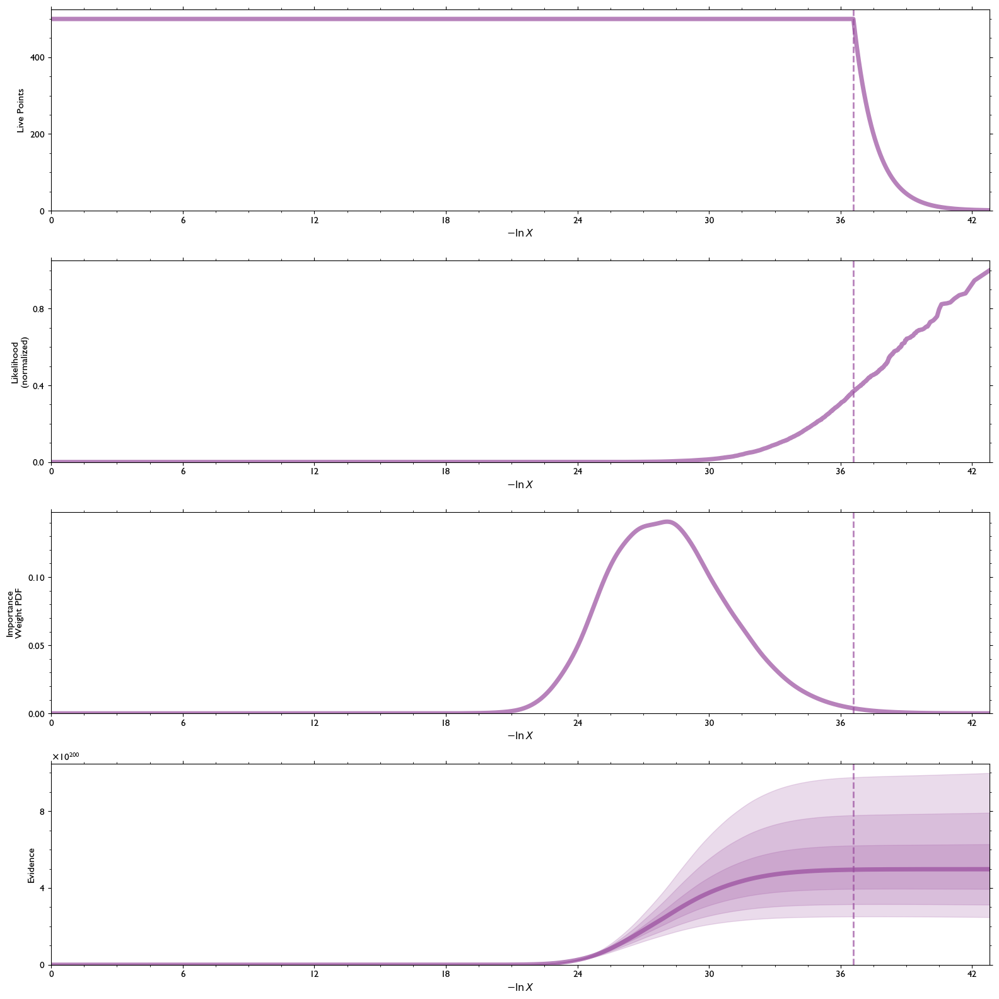

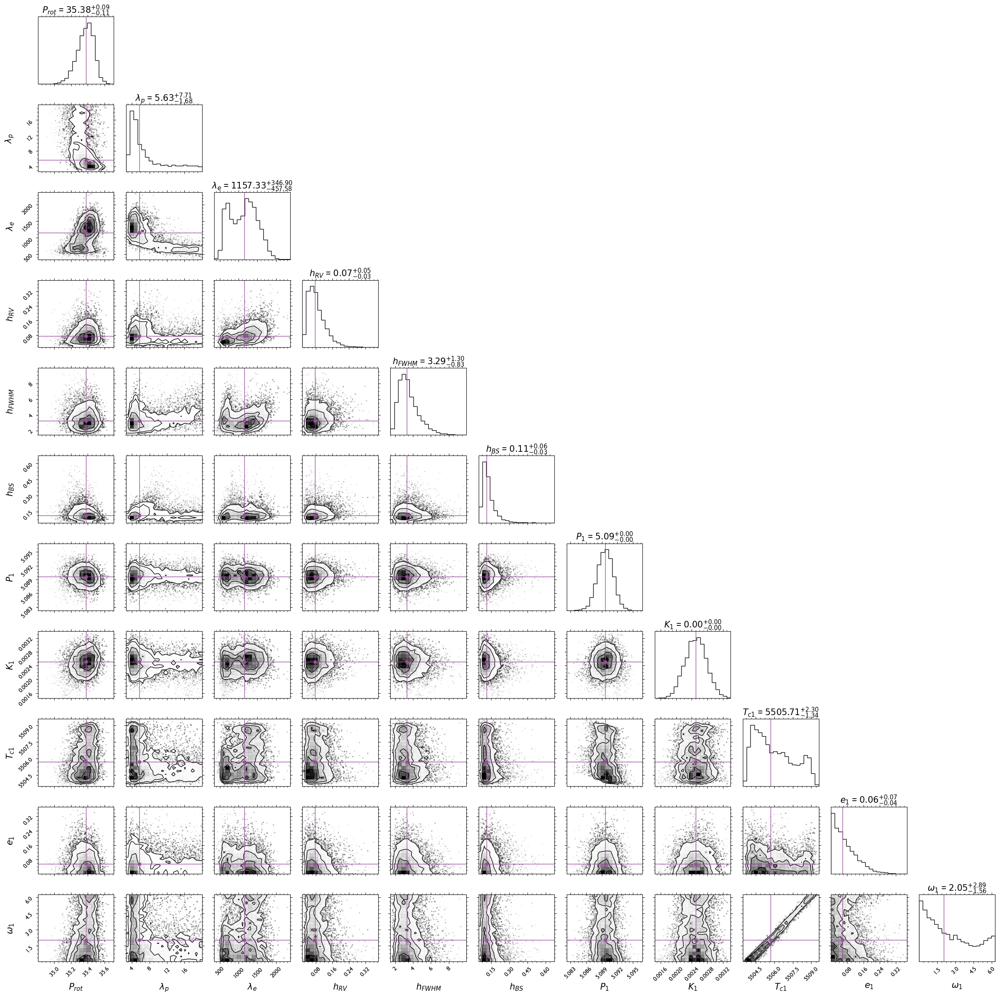

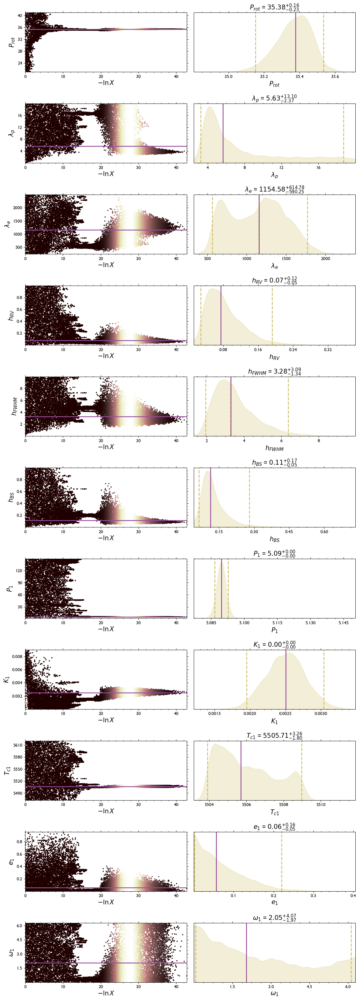

/Users/steven/Desktop/exo/sd2022/src/utils/plot_tool.py:345: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax[i].plot(x_test, mean[i], 'b', lw=2, label='GP Mean', color = colors[i])
/Users/steven/Desktop/exo/sd2022/src/utils/plot_tool.py:347: RuntimeWarning: invalid value encountered in sqrt
  mean[i] - 1.96 * np.sqrt(variance[i]),
/Users/steven/Desktop/exo/sd2022/src/utils/plot_tool.py:348: RuntimeWarning: invalid value encountered in sqrt
  mean[i] + 1.96 * np.sqrt(variance[i]),


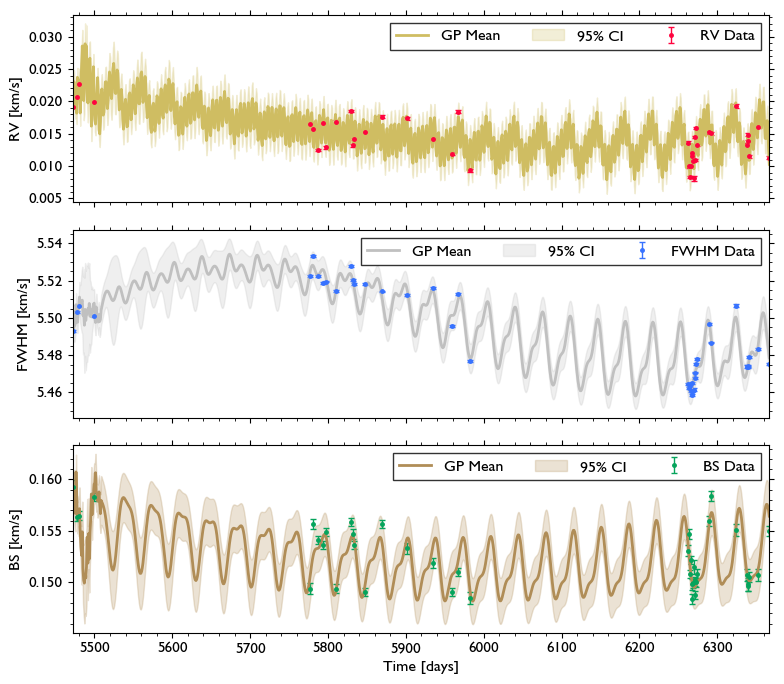

In [5]:
# === 1 Planet Model ==========================================================
print('Full Keplerian model run: ')
model = '1'

# Run nested sampling 
sampler1 = multi_stellar_gp(time, y, yerr, params_shared_bounds, params_individual_bounds, kepler_params_bounds_1, kepler_params_bounds_2, jitters = jitters, model = model)

# Print log evidence
results1 = sampler1.results
logZ1 = results1.logz[-1]       
logZerr1 = results1.logzerr[-1] 
print(f"Log-evidence: {logZ1:.2f} +/- {logZerr1:.2f}")

# Plot the sampling results
best_fit_parameters1 = plot_stellar_gp_results2(sampler1, get_value='median', cmap = 'pink', truth_color=sd2022_purple, corner_color='k', alpha = 0.25, run_color = sd2022_purple, post_color = sd2022_gold, model=model)
params_shared1= best_fit_parameters1[:3]
params_individual1 = best_fit_parameters1[3:]
keplerian_params1 = best_fit_parameters1[6:]

# Plot the prediction
jitters = np.array([1e-6, 1e-5, 1e-6])
time_pred = np.linspace(time.min(), time.max(), 1000)
mean, variance = gp_predict(time, y, time_pred, params_shared1, params_individual1, jitters, model, keplerian_params1)
plot_gp_predict(time, y, yerr, time_pred, mean, variance, colors_data = [sd2022_red, sd2022_blue, sd2022_green], colors = [sd2022_gold, sd2022_silver, sd2022_bronze], alpha = 0.25)

Full Keplerian model run: 
Running Nested Sampling for 2 planets...


24728it [11:21, 36.29it/s, +500 | bound: 328 | nc: 1 | ncall: 842282 | eff(%):  2.997 | loglstar:   -inf < 504.317 <    inf | logz: 459.511 +/-  0.259 | dlogz:  0.000 >  0.010]


Log-evidence: 459.51 +/- 0.26
Weighted Mean: [3.54064058e+01 6.48941272e+00 1.32856080e+03 8.54742676e-02
 3.64980638e+00 1.45937563e-01 5.08897774e+00 2.58098294e-03
 5.56296612e+03 7.75046221e-02 3.56315222e+00 5.97883592e+02
 2.88962748e-03 5.81336156e+03 3.11189296e-01 4.05764747e+00]
Weighted Standard Deviation: [8.60731774e-02 2.84437732e+00 3.25172149e+02 5.48672511e-02
 9.99810763e-01 7.07181040e-02 1.49018551e-03 3.17933311e-04
 1.36525931e+00 6.27527141e-02 1.67853158e+00 1.40811880e+02
 1.52476174e-03 1.67544045e+02 1.82558547e-01 1.77147071e+00]
MAP Estimate: [3.53762333e+01 4.29467543e+00 1.35713540e+03 5.33263842e-02
 3.52425017e+00 7.98980062e-02 5.08886649e+00 2.73766493e-03
 5.56444537e+03 9.00308138e-03 5.37604024e+00 4.81143007e+02
 4.25369403e-03 5.98899714e+03 4.89139477e-01 1.93349443e+00]
$P_{rot}$ = 35.41095 with 68% credible interval [-0.09088, +0.07992] and 95% credible interval [-0.18032, +0.14324]
$\lambda_p$ = 5.71596 with 68% credible interval [-1.51998, +

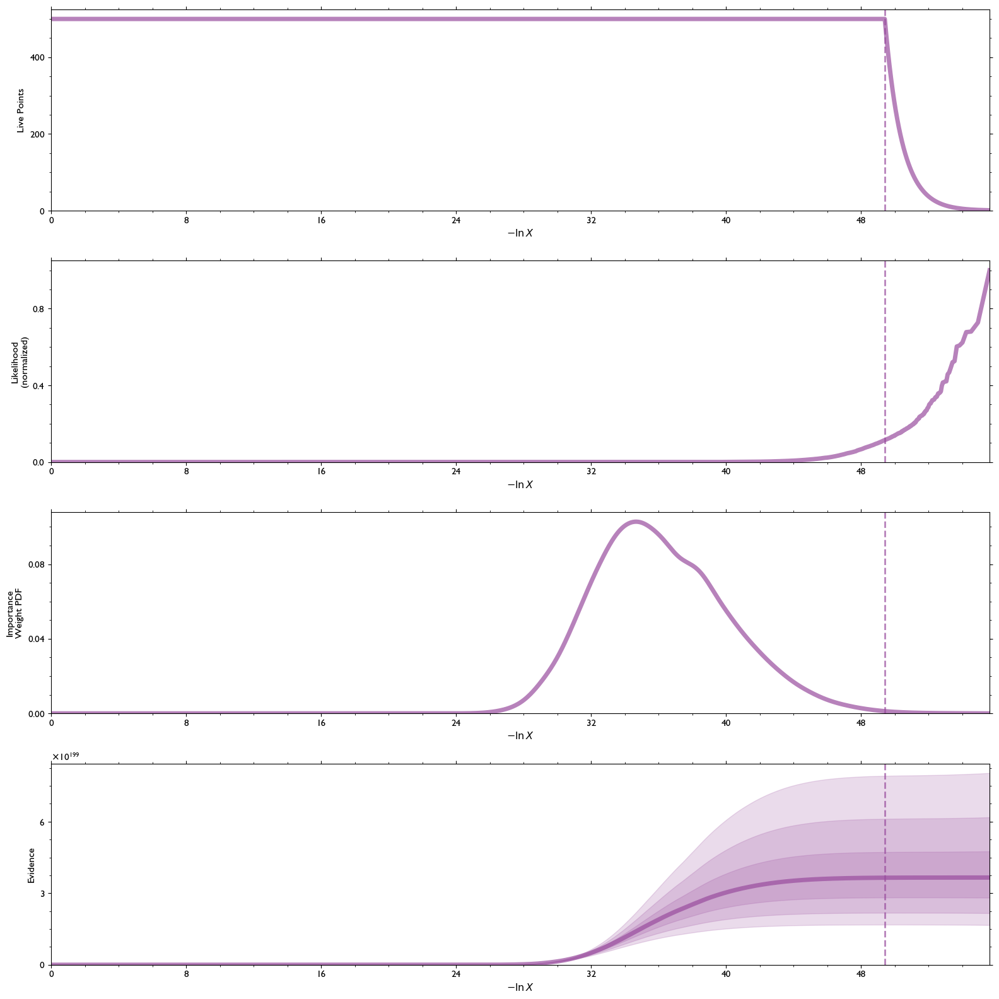

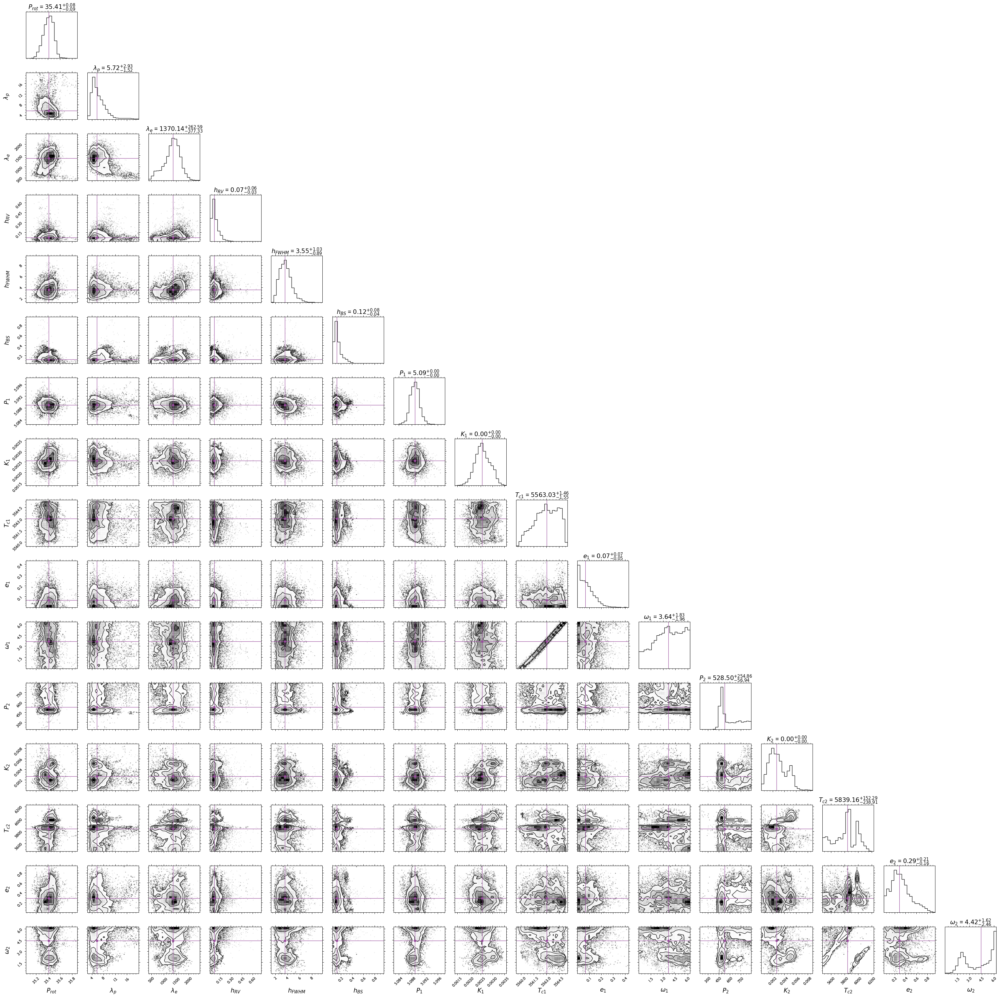

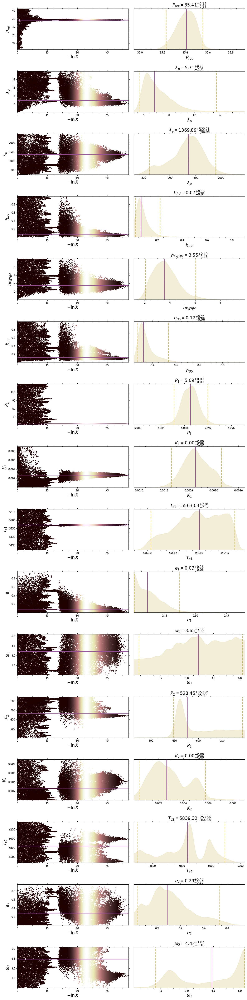

/Users/steven/Desktop/exo/sd2022/src/utils/plot_tool.py:345: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax[i].plot(x_test, mean[i], 'b', lw=2, label='GP Mean', color = colors[i])
/Users/steven/Desktop/exo/sd2022/src/utils/plot_tool.py:347: RuntimeWarning: invalid value encountered in sqrt
  mean[i] - 1.96 * np.sqrt(variance[i]),
/Users/steven/Desktop/exo/sd2022/src/utils/plot_tool.py:348: RuntimeWarning: invalid value encountered in sqrt
  mean[i] + 1.96 * np.sqrt(variance[i]),


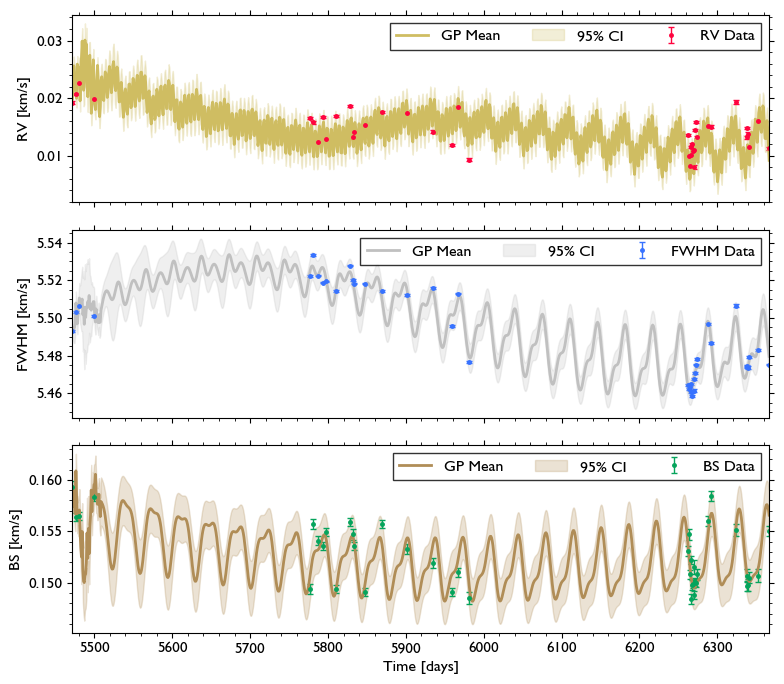

In [6]:
# === 2 Planet Model ==========================================================
print('Full Keplerian model run: ')
model = '2'

# Run nested sampling
sampler2 = multi_stellar_gp(time, y, yerr, params_shared_bounds, params_individual_bounds, kepler_params_bounds_1, kepler_params_bounds_2, jitters = jitters, model = model)

# Print log evidence
results2 = sampler2.results
logZ2 = results2.logz[-1]         
logZerr2 = results2.logzerr[-1]    
print(f"Log-evidence: {logZ2:.2f} +/- {logZerr2:.2f}")

# Plot the sampling results
best_fit_parameters2 = plot_stellar_gp_results2(sampler2, get_value='median', cmap = 'pink', truth_color=sd2022_purple, corner_color='k', alpha = 0.25, run_color = sd2022_purple, post_color = sd2022_gold, model=model)
params_shared2 = best_fit_parameters2[:3]
params_individual2 = best_fit_parameters2[3:]
keplerian_params2 = best_fit_parameters2[6:]

# Plot the prediction
jitters = np.array([1e-6, 1e-5, 1e-6])
time_pred = np.linspace(time.min(), time.max(), 1000)
mean, variance = gp_predict(time, y, time_pred, params_shared2, params_individual2, jitters, model, keplerian_params2)
plot_gp_predict(time, y, yerr, time_pred, mean, variance, colors_data = [sd2022_red, sd2022_blue, sd2022_green], colors = [sd2022_gold, sd2022_silver, sd2022_bronze], alpha = 0.25)

In [31]:
from scipy.constants import G, astronomical_unit

def estimate_properties(P, K, e, m_star, P_err_upper, P_err_lower, K_err_upper, K_err_lower, ms_err):
    # Define constants with more significant digits
    grav_const = G  # m^3 kg^-1 s^-2
    m_sun = 1.988500e30  # kg
    m_earth = 5.97219e24  # kg
    day_seconds = 86400  # s (24*60*60)
    au = 1.495978707e11  # m

    # Minimum mass of the planet
    Mp_min = K * ((P * day_seconds) / (2 * np.pi * grav_const))**(1/3) * (m_star * m_sun)**(2/3) * np.sqrt(1 - e**2)
    Mp_min_earth = Mp_min / m_earth

    # Semi-major axis of the planet
    a = (grav_const * m_star * m_sun * (P * day_seconds)**2 / (4 * np.pi**2))**(1/3)
    a_au = a / au

    # Error propagation for Mp_min
    Mp_min_err_up = Mp_min * np.sqrt(
        (K_err_upper / K)**2 +
        ((1/3 * P_err_upper / P)**2) +
        ((2/3 * ms_err / m_star)**2)
    ) / m_earth
    Mp_min_err_lo = Mp_min * np.sqrt(
        (K_err_lower / K)**2 +
        ((1/3 * P_err_lower / P)**2) +
        ((2/3 * ms_err / m_star)**2)
    ) / m_earth

    # Error propagation for a
    a_err_up = a * np.sqrt(
        ((2/3 * P_err_upper / P)**2) +
        ((1/3 * ms_err / m_star)**2)
    ) / au
    a_err_lo = a * np.sqrt(
        ((2/3 * P_err_lower / P)**2) +
        ((1/3 * ms_err / m_star)**2)
    ) / au

    results = {
        'Mp_min': Mp_min,
        'Mp_min_earth': Mp_min_earth,
        'Mp_min_err_up': Mp_min_err_up,
        'Mp_min_err_lo': Mp_min_err_lo,
        'a': a,
        'a_au': a_au,
        'a_err_up': a_err_up,
        'a_err_lo': a_err_lo
    }

    # Print results
    print(f"Minimum mass of the planet: {Mp_min:.2e} kg ({Mp_min_earth:.2f} Earth masses)")
    print(f"Error: +{Mp_min_err_up:.2e} Earth masses, -{Mp_min_err_lo:.2e} Earth masses")
    print(f"Semi-major axis of the planet: {a:.2e} m ({a_au:.2f} AU)")
    print(f"Error: +{a_err_up:.2e} AU, -{a_err_lo:.2e} AU")

    return results

# Estimate the properties of the planet
m_star = 0.69 # Stellar mass in solar masses
ms_err = 0.01 # Stellar mass error in solar masses
per = 5.09
per_err_upper = 0.01
per_err_lower = 0.02
K = 2.51 # Semi-amplitude in m/s
K_err_upper = 0.27 # Upper bound of the semi-amplitude error
K_err_lower = 0.29 # Lower bound of the semi-amplitude error
e = 0.057 # Eccentricity


results = estimate_properties(per, K, e, m_star, per_err_upper, per_err_lower, K_err_upper, K_err_lower, ms_err)

print(results)





Minimum mass of the planet: 3.14e+25 kg (5.26 Earth masses)
Error: +5.69e-01 Earth masses, -6.10e-01 Earth masses
Semi-major axis of the planet: 7.66e+09 m (0.05 AU)
Error: +2.56e-04 AU, -2.81e-04 AU
{'Mp_min': 3.1436353456381655e+25, 'Mp_min_earth': 5.263789908958297, 'Mp_min_err_up': 0.5685142842846537, 'Mp_min_err_lo': 0.610328688246828, 'a': 7655282833.8904915, 'a_au': 0.05117240504874707, 'a_err_up': 0.00025613428506300406, 'a_err_lo': 0.0002812137995321762}
